In [1]:
! pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 71.7 MB/s eta 0:00:00:00:0100:01


In [2]:
# general
import matplotlib.pyplot as plt
import numpy as np
import os
import rasterio

# for ML
from torch.utils.data import Dataset, DataLoader
import torch
import torch.nn as nn
import torch.nn.functional as F

In [3]:
class ChangeDetectionDataset(Dataset):
    def __init__(self, x1_dir, x2_dir, mask_dir):
        self.x1_dir = x1_dir          # Directory for "before" images
        self.x2_dir = x2_dir          # Directory for "after" images
        self.mask_dir = mask_dir      # Directory for segmentation masks
        self.image_names = os.listdir(x1_dir)  # Assuming x1 and x2 have matching file names
    
    def __len__(self):
        return len(self.image_names)

    def __getitem__(self, index):
        # Get file paths
        x1_path = os.path.join(self.x1_dir, self.image_names[index])
        x2_path = os.path.join(self.x2_dir, self.image_names[index])
        mask_path = os.path.join(self.mask_dir, self.image_names[index])

        # Read images using rasterio
        with rasterio.open(x1_path) as src:
            x1 = src.read()
        with rasterio.open(x2_path) as src:
            x2 = src.read()
        with rasterio.open(mask_path) as src:
            mask = src.read(1)
            geotransformation = src.transform

        x1 = torch.tensor(x1, dtype=torch.float32) / 255.0  # Normalize to [0,1]
        x2 = torch.tensor(x2, dtype=torch.float32) / 255.0
        mask = torch.tensor(mask, dtype=torch.long)

        return x1, x2, mask, geotransformation


    def plot(self, index):
        x1, x2, mask, _ = self[index]

        # Convert tensors to numpy 
        x1 = x1.numpy()
        x2 = x2.numpy()
        mask = mask.numpy()

        # transpose to (H, W, C) for plotting
        x1 = x1.transpose(1, 2, 0)
        x2 = x2.transpose(1, 2, 0)

        # Plotting
        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.imshow(x1)
        plt.title('Image 1')
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(x2)
        plt.title('Image 2')
        plt.axis('off') 

        plt.subplot(1, 3, 3)
        plt.imshow(mask, cmap='jet') 
        plt.title('Segmentation Mask')
        plt.axis('off')  # Hide axes

        plt.show()        

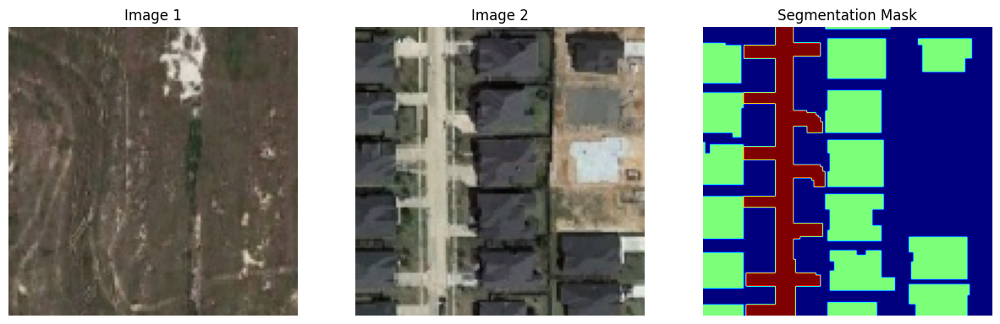

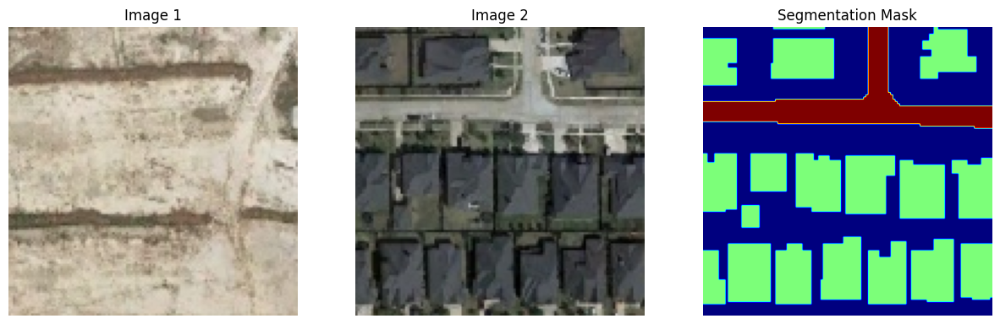

In [4]:
BASE_DATASET_DIR = '/kaggle/input/change-detection/dataset'

train_dataset = ChangeDetectionDataset(
    x1_dir = os.path.join(BASE_DATASET_DIR, 'train/image_1'),
    x2_dir = os.path.join(BASE_DATASET_DIR, 'train/image_2'), 
    mask_dir = os.path.join(BASE_DATASET_DIR, 'train/mask'), 
)

validation_dataset = ChangeDetectionDataset(
    x1_dir = os.path.join(BASE_DATASET_DIR, 'validation/image_1'),
    x2_dir = os.path.join(BASE_DATASET_DIR, 'validation/image_2'), 
    mask_dir = os.path.join(BASE_DATASET_DIR, 'validation/mask'), 
)

# plot some dataset pares 
train_dataset.plot(12)
validation_dataset.plot(5)

In [5]:
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
val_loader = DataLoader(validation_dataset, batch_size=4, shuffle=True)

In [6]:
class Resnet_block1(nn.Module):
    def __init__(self, in_channels=3, out_channels=16):
        super(Resnet_block1, self).__init__()

        self.res_block = nn.Sequential(
            nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, padding='same'),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
            nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, padding='same'),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
            nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, padding='same'),
            nn.BatchNorm2d(out_channels)
        )

        self.skip_connection = nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=1)

    def forward(self, x):
        res = self.res_block(x)
        x = self.skip_connection(x)
        return res + x

class Upsample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Upsample, self).__init__()
        self.upsample = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding='same'),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding='same'),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding='same'),
            nn.BatchNorm2d(out_channels),
            nn.ReLU()
        ) 
    
    def forward(self, x):
        return self.upsample(x)



class Change_detection_model(nn.Module):
    def __init__(self):
        super(Change_detection_model, self).__init__()

        # Encoder
        self.res_block1 = Resnet_block1(in_channels=3, out_channels=16)
        self.res_block2 = Resnet_block1(in_channels=16, out_channels=32)
        self.res_block3 = Resnet_block1(in_channels=32, out_channels=64)
        self.res_block4 = Resnet_block1(in_channels=64, out_channels=128)

        self.pool = nn.MaxPool2d(2,2)


        # Decoder
        self.upsample_1 = Upsample(in_channels=128, out_channels=64)
        self.upsample_2 = Upsample(in_channels=64 * 2, out_channels=32)
        self.upsample_3 = Upsample(in_channels=32 * 2, out_channels=16)
        self.upsample_4 = Upsample(in_channels=16 * 2, out_channels=8)

        
        # output
        self.output = nn.Conv2d(in_channels=8, out_channels=3, kernel_size=1)
        
    def forward(self, x1, x2):

        # Encoding
        left_out1 = self.pool(self.res_block1(x1))
        left_out2 = self.pool(self.res_block2(left_out1))
        left_out3 = self.pool(self.res_block3(left_out2))
        left_out4 = self.pool(self.res_block4(left_out3))

        right_out1 = self.pool(self.res_block1(x2))
        right_out2 = self.pool(self.res_block2(right_out1))
        right_out3 = self.pool(self.res_block3(right_out2))
        right_out4 = self.pool(self.res_block4(right_out3))
        # print(right_out4.shape)
        # print(left_out4.shape)

        # Difrence
        difrence1 = torch.abs(right_out1-left_out1)
        difrence2 = torch.abs(right_out2-left_out2)
        difrence3 = torch.abs(right_out3-left_out3)
        difrence4 = torch.abs(right_out4-left_out4)

        
        # decoding
        up_1 = self.upsample_1(difrence4)
        up_2 = self.upsample_2(torch.concat([up_1, difrence3], dim = 1))
        up_3 = self.upsample_3(torch.concat([up_2, difrence2], dim = 1))
        up_4 = self.upsample_4(torch.concat([up_3, difrence1], dim = 1))

        # prediction
        y = self.output(up_4)
        return y


In [7]:
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import matplotlib.pyplot as plt
from sklearn.metrics import jaccard_score, f1_score, accuracy_score, precision_score, recall_score

# Initialize the model, optimizer, and loss function
model = Change_detection_model()
criterion = nn.CrossEntropyLoss()  # Cross-entropy for multi-class segmentation
optimizer = optim.Adam(model.parameters(), lr=0.0001)

# Move model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

Change_detection_model(
  (res_block1): Resnet_block1(
    (res_block): Sequential(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=same)
      (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=same)
      (4): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
      (6): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=same)
      (7): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (skip_connection): Conv2d(3, 16, kernel_size=(1, 1), stride=(1, 1))
  )
  (res_block2): Resnet_block1(
    (res_block): Sequential(
      (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 

In [8]:
train_losses = []
val_losses = []
val_metrics = []


# Function to calculate multi-class segmentation metrics
def calculate_multiclass_metrics(pred, target, n_classes):
    pred = pred.cpu().numpy().flatten()
    target = target.cpu().numpy().flatten()
    
    iou = jaccard_score(target, pred, average='macro', labels=list(range(n_classes)))
    dice = f1_score(target, pred, average='macro')
    
    return {
        "Mean IoU": iou,
        "Mean Dice Coefficient": dice,
    }



Epoch 1/100 - Training: 100%|██████████| 39/39 [00:05<00:00,  7.39it/s]


Epoch [1/100], Training Loss: 1.4639


Epoch 1/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 11.39it/s]


Epoch [1/100], Validation Loss: 1.3962
Validation Metrics: {'Mean IoU': 0.04388745625813802, 'Mean Dice Coefficient': 0.07756280931329008}


Epoch 2/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.76it/s]


Epoch [2/100], Training Loss: 1.3445


Epoch 2/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 27.71it/s]


Epoch [2/100], Validation Loss: 1.2950
Validation Metrics: {'Mean IoU': 0.04388745625813802, 'Mean Dice Coefficient': 0.07756280931329008}


Epoch 3/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.14it/s]


Epoch [3/100], Training Loss: 1.2758


Epoch 3/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.18it/s]


Epoch [3/100], Validation Loss: 1.2256
Validation Metrics: {'Mean IoU': 0.04389301007168616, 'Mean Dice Coefficient': 0.07757445914644027}


Epoch 4/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 19.75it/s]


Epoch [4/100], Training Loss: 1.2240


Epoch 4/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.79it/s]


Epoch [4/100], Validation Loss: 1.1982
Validation Metrics: {'Mean IoU': 0.04529157432678718, 'Mean Dice Coefficient': 0.08067910003668959}


Epoch 5/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 19.77it/s]


Epoch [5/100], Training Loss: 1.1928


Epoch 5/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 27.86it/s]


Epoch [5/100], Validation Loss: 1.1700
Validation Metrics: {'Mean IoU': 0.043898562857357014, 'Mean Dice Coefficient': 0.07758759425519053}


Epoch 6/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 19.91it/s]


Epoch [6/100], Training Loss: 1.1730


Epoch 6/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 27.23it/s]


Epoch [6/100], Validation Loss: 1.1460
Validation Metrics: {'Mean IoU': 0.04388745625813802, 'Mean Dice Coefficient': 0.07756280931329008}


Epoch 7/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 19.81it/s]


Epoch [7/100], Training Loss: 1.1561


Epoch 7/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 27.86it/s]


Epoch [7/100], Validation Loss: 1.1356
Validation Metrics: {'Mean IoU': 0.04388745625813802, 'Mean Dice Coefficient': 0.07756280931329008}


Epoch 8/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 19.58it/s]


Epoch [8/100], Training Loss: 1.1498


Epoch 8/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 27.20it/s]


Epoch [8/100], Validation Loss: 1.1172
Validation Metrics: {'Mean IoU': 0.04390449511199082, 'Mean Dice Coefficient': 0.07759611508794696}


Epoch 9/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.78it/s]


Epoch [9/100], Training Loss: 1.1556


Epoch 9/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.54it/s]


Epoch [9/100], Validation Loss: 1.1281
Validation Metrics: {'Mean IoU': 0.04389521434489702, 'Mean Dice Coefficient': 0.07757827359304142}


Epoch 10/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.29it/s]


Epoch [10/100], Training Loss: 1.1262


Epoch 10/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 27.89it/s]


Epoch [10/100], Validation Loss: 1.1053
Validation Metrics: {'Mean IoU': 0.043890802182519305, 'Mean Dice Coefficient': 0.07756952293042743}


Epoch 11/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.35it/s]


Epoch [11/100], Training Loss: 1.1172


Epoch 11/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.11it/s]


Epoch [11/100], Validation Loss: 1.0950
Validation Metrics: {'Mean IoU': 0.04388838891241734, 'Mean Dice Coefficient': 0.07756463792750072}


Epoch 12/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.37it/s]


Epoch [12/100], Training Loss: 1.1074


Epoch 12/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.06it/s]


Epoch [12/100], Validation Loss: 1.1041
Validation Metrics: {'Mean IoU': 0.043889321567016, 'Mean Dice Coefficient': 0.07756646653350359}


Epoch 13/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 17.50it/s]


Epoch [13/100], Training Loss: 1.0953


Epoch 13/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 22.85it/s]


Epoch [13/100], Validation Loss: 1.0774
Validation Metrics: {'Mean IoU': 0.04389173845193481, 'Mean Dice Coefficient': 0.0775724732292249}


Epoch 14/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.99it/s]


Epoch [14/100], Training Loss: 1.0757


Epoch 14/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 26.72it/s]


Epoch [14/100], Validation Loss: 1.0399
Validation Metrics: {'Mean IoU': 0.04390885274566648, 'Mean Dice Coefficient': 0.07760515161655232}


Epoch 15/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 16.42it/s]


Epoch [15/100], Training Loss: 1.0591


Epoch 15/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 22.25it/s]


Epoch [15/100], Validation Loss: 1.0583
Validation Metrics: {'Mean IoU': 0.046280819075449176, 'Mean Dice Coefficient': 0.08237503445328914}


Epoch 16/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 17.29it/s]


Epoch [16/100], Training Loss: 1.0467


Epoch 16/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 22.95it/s]


Epoch [16/100], Validation Loss: 1.0484
Validation Metrics: {'Mean IoU': 0.04956119410556176, 'Mean Dice Coefficient': 0.08878564153862901}


Epoch 17/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 17.14it/s]


Epoch [17/100], Training Loss: 1.0381


Epoch 17/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.46it/s]


Epoch [17/100], Validation Loss: 1.0381
Validation Metrics: {'Mean IoU': 0.04417404888411041, 'Mean Dice Coefficient': 0.07813783756839277}


Epoch 18/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 17.20it/s]


Epoch [18/100], Training Loss: 1.0221


Epoch 18/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.85it/s]


Epoch [18/100], Validation Loss: 1.0485
Validation Metrics: {'Mean IoU': 0.044800656703044985, 'Mean Dice Coefficient': 0.07939208822965725}


Epoch 19/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.47it/s]


Epoch [19/100], Training Loss: 1.0014


Epoch 19/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 27.47it/s]


Epoch [19/100], Validation Loss: 1.0092
Validation Metrics: {'Mean IoU': 0.044703509801684575, 'Mean Dice Coefficient': 0.07918707876085725}


Epoch 20/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.30it/s]


Epoch [20/100], Training Loss: 0.9893


Epoch 20/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 29.81it/s]


Epoch [20/100], Validation Loss: 1.0166
Validation Metrics: {'Mean IoU': 0.06849489343216203, 'Mean Dice Coefficient': 0.12399046397728429}


Epoch 21/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.05it/s]


Epoch [21/100], Training Loss: 0.9843


Epoch 21/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 26.41it/s]


Epoch [21/100], Validation Loss: 0.9570
Validation Metrics: {'Mean IoU': 0.28079527685331057, 'Mean Dice Coefficient': 0.3642358895186653}


Epoch 22/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.79it/s]


Epoch [22/100], Training Loss: 0.9607


Epoch 22/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.00it/s]


Epoch [22/100], Validation Loss: 0.9535
Validation Metrics: {'Mean IoU': 0.26732191978442094, 'Mean Dice Coefficient': 0.36668819221254595}


Epoch 23/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 20.24it/s]


Epoch [23/100], Training Loss: 0.9491


Epoch 23/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.30it/s]


Epoch [23/100], Validation Loss: 0.9327
Validation Metrics: {'Mean IoU': 0.2921802589509139, 'Mean Dice Coefficient': 0.3884164793341494}


Epoch 24/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 19.57it/s]


Epoch [24/100], Training Loss: 0.9363


Epoch 24/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 29.76it/s]


Epoch [24/100], Validation Loss: 0.9559
Validation Metrics: {'Mean IoU': 0.2503639173351264, 'Mean Dice Coefficient': 0.35100900779663435}


Epoch 25/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 17.80it/s]


Epoch [25/100], Training Loss: 0.9336


Epoch 25/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 29.25it/s]


Epoch [25/100], Validation Loss: 0.9022
Validation Metrics: {'Mean IoU': 0.31842138112495094, 'Mean Dice Coefficient': 0.41200669951258884}


Epoch 26/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.32it/s]


Epoch [26/100], Training Loss: 0.9129


Epoch 26/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 30.73it/s]


Epoch [26/100], Validation Loss: 0.9355
Validation Metrics: {'Mean IoU': 0.2802012735534433, 'Mean Dice Coefficient': 0.3773551414638366}


Epoch 27/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.32it/s]


Epoch [27/100], Training Loss: 0.9070


Epoch 27/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 27.87it/s]


Epoch [27/100], Validation Loss: 0.9562
Validation Metrics: {'Mean IoU': 0.24322227575399324, 'Mean Dice Coefficient': 0.3395160021221722}


Epoch 28/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.23it/s]


Epoch [28/100], Training Loss: 0.9102


Epoch 28/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.37it/s]


Epoch [28/100], Validation Loss: 0.8664
Validation Metrics: {'Mean IoU': 0.3380385412699836, 'Mean Dice Coefficient': 0.4281751002984187}


Epoch 29/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.41it/s]


Epoch [29/100], Training Loss: 0.8817


Epoch 29/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 26.68it/s]


Epoch [29/100], Validation Loss: 0.8845
Validation Metrics: {'Mean IoU': 0.3084772987864806, 'Mean Dice Coefficient': 0.40358248886573783}


Epoch 30/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.21it/s]


Epoch [30/100], Training Loss: 0.8680


Epoch 30/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 26.54it/s]


Epoch [30/100], Validation Loss: 0.8702
Validation Metrics: {'Mean IoU': 0.32382148118072845, 'Mean Dice Coefficient': 0.40774190637579794}


Epoch 31/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 19.51it/s]


Epoch [31/100], Training Loss: 0.8517


Epoch 31/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 26.02it/s]


Epoch [31/100], Validation Loss: 0.8653
Validation Metrics: {'Mean IoU': 0.30640861125430835, 'Mean Dice Coefficient': 0.4019593763437721}


Epoch 32/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.47it/s]


Epoch [32/100], Training Loss: 0.8441


Epoch 32/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 26.35it/s]


Epoch [32/100], Validation Loss: 0.8899
Validation Metrics: {'Mean IoU': 0.2880710253429707, 'Mean Dice Coefficient': 0.3735520624151558}


Epoch 33/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.49it/s]


Epoch [33/100], Training Loss: 0.8333


Epoch 33/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 26.96it/s]


Epoch [33/100], Validation Loss: 0.8356
Validation Metrics: {'Mean IoU': 0.3215560523990451, 'Mean Dice Coefficient': 0.412873040632512}


Epoch 34/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.31it/s]


Epoch [34/100], Training Loss: 0.8185


Epoch 34/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 27.59it/s]


Epoch [34/100], Validation Loss: 0.8496
Validation Metrics: {'Mean IoU': 0.2882740623339248, 'Mean Dice Coefficient': 0.3862047769140675}


Epoch 35/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.40it/s]


Epoch [35/100], Training Loss: 0.8057


Epoch 35/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.29it/s]


Epoch [35/100], Validation Loss: 0.8371
Validation Metrics: {'Mean IoU': 0.30198258968093145, 'Mean Dice Coefficient': 0.39841986351808534}


Epoch 36/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.95it/s]


Epoch [36/100], Training Loss: 0.7950


Epoch 36/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 24.94it/s]


Epoch [36/100], Validation Loss: 0.7975
Validation Metrics: {'Mean IoU': 0.33823071565082613, 'Mean Dice Coefficient': 0.42955939827388595}


Epoch 37/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 16.94it/s]


Epoch [37/100], Training Loss: 0.7955


Epoch 37/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 29.25it/s]


Epoch [37/100], Validation Loss: 0.7622
Validation Metrics: {'Mean IoU': 0.35782261252699654, 'Mean Dice Coefficient': 0.44606548006281344}


Epoch 38/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.41it/s]


Epoch [38/100], Training Loss: 0.7845


Epoch 38/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 27.94it/s]


Epoch [38/100], Validation Loss: 1.0836
Validation Metrics: {'Mean IoU': 0.2593664935656736, 'Mean Dice Coefficient': 0.3598657449713893}


Epoch 39/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.91it/s]


Epoch [39/100], Training Loss: 0.7756


Epoch 39/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.39it/s]


Epoch [39/100], Validation Loss: 0.7868
Validation Metrics: {'Mean IoU': 0.3322632024923265, 'Mean Dice Coefficient': 0.42191458920550756}


Epoch 40/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.69it/s]


Epoch [40/100], Training Loss: 0.7783


Epoch 40/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 25.66it/s]


Epoch [40/100], Validation Loss: 0.7845
Validation Metrics: {'Mean IoU': 0.3384636183567154, 'Mean Dice Coefficient': 0.4275765651249899}


Epoch 41/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.35it/s]


Epoch [41/100], Training Loss: 0.7500


Epoch 41/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 29.19it/s]


Epoch [41/100], Validation Loss: 0.8170
Validation Metrics: {'Mean IoU': 0.3079985645286699, 'Mean Dice Coefficient': 0.3998349935935694}


Epoch 42/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.23it/s]


Epoch [42/100], Training Loss: 0.7425


Epoch 42/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.63it/s]


Epoch [42/100], Validation Loss: 0.7597
Validation Metrics: {'Mean IoU': 0.3254737289607739, 'Mean Dice Coefficient': 0.4186220440273962}


Epoch 43/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 19.64it/s]


Epoch [43/100], Training Loss: 0.7366


Epoch 43/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 30.00it/s]


Epoch [43/100], Validation Loss: 0.7644
Validation Metrics: {'Mean IoU': 0.3194959719483246, 'Mean Dice Coefficient': 0.41371783426579983}


Epoch 44/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.26it/s]


Epoch [44/100], Training Loss: 0.7176


Epoch 44/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 29.01it/s]


Epoch [44/100], Validation Loss: 0.7027
Validation Metrics: {'Mean IoU': 0.3768399419331249, 'Mean Dice Coefficient': 0.4613532349924268}


Epoch 45/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 19.92it/s]


Epoch [45/100], Training Loss: 0.7067


Epoch 45/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.63it/s]


Epoch [45/100], Validation Loss: 0.7069
Validation Metrics: {'Mean IoU': 0.37065638794350003, 'Mean Dice Coefficient': 0.45660680998303804}


Epoch 46/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 19.61it/s]


Epoch [46/100], Training Loss: 0.7081


Epoch 46/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.03it/s]


Epoch [46/100], Validation Loss: 0.7000
Validation Metrics: {'Mean IoU': 0.37467308949191214, 'Mean Dice Coefficient': 0.4593540047106817}


Epoch 47/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 20.31it/s]


Epoch [47/100], Training Loss: 0.7058


Epoch 47/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 27.56it/s]


Epoch [47/100], Validation Loss: 0.8003
Validation Metrics: {'Mean IoU': 0.27318089319303285, 'Mean Dice Coefficient': 0.37217963923807007}


Epoch 48/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.38it/s]


Epoch [48/100], Training Loss: 0.6860


Epoch 48/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 23.47it/s]


Epoch [48/100], Validation Loss: 0.7177
Validation Metrics: {'Mean IoU': 0.34621482399080455, 'Mean Dice Coefficient': 0.43589672011020714}


Epoch 49/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.02it/s]


Epoch [49/100], Training Loss: 0.6796


Epoch 49/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 24.44it/s]


Epoch [49/100], Validation Loss: 0.6941
Validation Metrics: {'Mean IoU': 0.34259769461057044, 'Mean Dice Coefficient': 0.43345072313011856}


Epoch 50/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 19.50it/s]


Epoch [50/100], Training Loss: 0.6555


Epoch 50/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 30.19it/s]


Epoch [50/100], Validation Loss: 0.6929
Validation Metrics: {'Mean IoU': 0.3443607294998327, 'Mean Dice Coefficient': 0.4350338318123706}


Epoch 51/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 19.63it/s]


Epoch [51/100], Training Loss: 0.6602


Epoch 51/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 26.30it/s]


Epoch [51/100], Validation Loss: 0.6780
Validation Metrics: {'Mean IoU': 0.3606678012273779, 'Mean Dice Coefficient': 0.4487911691859408}


Epoch 52/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.40it/s]


Epoch [52/100], Training Loss: 0.6420


Epoch 52/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 30.05it/s]


Epoch [52/100], Validation Loss: 0.7150
Validation Metrics: {'Mean IoU': 0.3467647044979431, 'Mean Dice Coefficient': 0.4340566839095448}


Epoch 53/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.00it/s]


Epoch [53/100], Training Loss: 0.6291


Epoch 53/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 27.71it/s]


Epoch [53/100], Validation Loss: 0.6468
Validation Metrics: {'Mean IoU': 0.3783382689262318, 'Mean Dice Coefficient': 0.4636184365532759}


Epoch 54/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.45it/s]


Epoch [54/100], Training Loss: 0.6274


Epoch 54/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 26.61it/s]


Epoch [54/100], Validation Loss: 0.6444
Validation Metrics: {'Mean IoU': 0.39919004948614734, 'Mean Dice Coefficient': 0.4786009323912192}


Epoch 55/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.46it/s]


Epoch [55/100], Training Loss: 0.6180


Epoch 55/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 27.24it/s]


Epoch [55/100], Validation Loss: 0.6335
Validation Metrics: {'Mean IoU': 0.3890211142354402, 'Mean Dice Coefficient': 0.4712734711410376}


Epoch 56/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 19.58it/s]


Epoch [56/100], Training Loss: 0.6067


Epoch 56/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 27.83it/s]


Epoch [56/100], Validation Loss: 0.6622
Validation Metrics: {'Mean IoU': 0.34830692597911295, 'Mean Dice Coefficient': 0.43746017695729167}


Epoch 57/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.23it/s]


Epoch [57/100], Training Loss: 0.5890


Epoch 57/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 30.01it/s]


Epoch [57/100], Validation Loss: 0.6321
Validation Metrics: {'Mean IoU': 0.36353686649166966, 'Mean Dice Coefficient': 0.45102872820381085}


Epoch 58/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.32it/s]


Epoch [58/100], Training Loss: 0.5830


Epoch 58/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 25.53it/s]


Epoch [58/100], Validation Loss: 0.6025
Validation Metrics: {'Mean IoU': 0.38852197144172607, 'Mean Dice Coefficient': 0.47077926459518116}


Epoch 59/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.86it/s]


Epoch [59/100], Training Loss: 0.5637


Epoch 59/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 27.70it/s]


Epoch [59/100], Validation Loss: 0.5925
Validation Metrics: {'Mean IoU': 0.3851497961143944, 'Mean Dice Coefficient': 0.4684361234182069}


Epoch 60/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.49it/s]


Epoch [60/100], Training Loss: 0.5573


Epoch 60/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.14it/s]


Epoch [60/100], Validation Loss: 0.5946
Validation Metrics: {'Mean IoU': 0.39392976482261766, 'Mean Dice Coefficient': 0.47514427828889333}


Epoch 61/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.34it/s]


Epoch [61/100], Training Loss: 0.5468


Epoch 61/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 23.74it/s]


Epoch [61/100], Validation Loss: 0.5934
Validation Metrics: {'Mean IoU': 0.39302306927112873, 'Mean Dice Coefficient': 0.4691469343270032}


Epoch 62/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.79it/s]


Epoch [62/100], Training Loss: 0.5345


Epoch 62/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 24.80it/s]


Epoch [62/100], Validation Loss: 0.5755
Validation Metrics: {'Mean IoU': 0.4192710082599236, 'Mean Dice Coefficient': 0.4935126674973381}


Epoch 63/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 19.84it/s]


Epoch [63/100], Training Loss: 0.5188


Epoch 63/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 30.98it/s]


Epoch [63/100], Validation Loss: 0.5286
Validation Metrics: {'Mean IoU': 0.7225130015765678, 'Mean Dice Coefficient': 0.833348937065504}


Epoch 64/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.05it/s]


Epoch [64/100], Training Loss: 0.5050


Epoch 64/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.72it/s]


Epoch [64/100], Validation Loss: 0.5315
Validation Metrics: {'Mean IoU': 0.724760558738093, 'Mean Dice Coefficient': 0.8350222547490285}


Epoch 65/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 19.79it/s]


Epoch [65/100], Training Loss: 0.4890


Epoch 65/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 30.63it/s]


Epoch [65/100], Validation Loss: 0.5200
Validation Metrics: {'Mean IoU': 0.7222764709137933, 'Mean Dice Coefficient': 0.8334099793270799}


Epoch 66/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 19.53it/s]


Epoch [66/100], Training Loss: 0.4845


Epoch 66/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 29.64it/s]


Epoch [66/100], Validation Loss: 0.5144
Validation Metrics: {'Mean IoU': 0.7657137343450912, 'Mean Dice Coefficient': 0.8638479899417851}


Epoch 67/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 20.06it/s]


Epoch [67/100], Training Loss: 0.4709


Epoch 67/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.27it/s]


Epoch [67/100], Validation Loss: 0.5622
Validation Metrics: {'Mean IoU': 0.6429965484478477, 'Mean Dice Coefficient': 0.7693603775320005}


Epoch 68/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.49it/s]


Epoch [68/100], Training Loss: 0.4534


Epoch 68/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 30.11it/s]


Epoch [68/100], Validation Loss: 0.4971
Validation Metrics: {'Mean IoU': 0.7598296614538421, 'Mean Dice Coefficient': 0.8602659497278626}


Epoch 69/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.10it/s]


Epoch [69/100], Training Loss: 0.4446


Epoch 69/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.60it/s]


Epoch [69/100], Validation Loss: 0.4638
Validation Metrics: {'Mean IoU': 0.7605733234144259, 'Mean Dice Coefficient': 0.8588499262360113}


Epoch 70/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 19.70it/s]


Epoch [70/100], Training Loss: 0.4411


Epoch 70/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 21.22it/s]


Epoch [70/100], Validation Loss: 0.4624
Validation Metrics: {'Mean IoU': 0.7810837521475028, 'Mean Dice Coefficient': 0.8740031598255765}


Epoch 71/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.11it/s]


Epoch [71/100], Training Loss: 0.4335


Epoch 71/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 25.77it/s]


Epoch [71/100], Validation Loss: 0.4696
Validation Metrics: {'Mean IoU': 0.7578213513404259, 'Mean Dice Coefficient': 0.8572158115863348}


Epoch 72/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.31it/s]


Epoch [72/100], Training Loss: 0.4235


Epoch 72/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 23.84it/s]


Epoch [72/100], Validation Loss: 0.4533
Validation Metrics: {'Mean IoU': 0.7787426508342573, 'Mean Dice Coefficient': 0.8723045780645124}


Epoch 73/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.19it/s]


Epoch [73/100], Training Loss: 0.4166


Epoch 73/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 30.89it/s]


Epoch [73/100], Validation Loss: 0.4872
Validation Metrics: {'Mean IoU': 0.703479894013226, 'Mean Dice Coefficient': 0.8194575136377301}


Epoch 74/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 20.18it/s]


Epoch [74/100], Training Loss: 0.4011


Epoch 74/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.28it/s]


Epoch [74/100], Validation Loss: 0.4295
Validation Metrics: {'Mean IoU': 0.766169544858573, 'Mean Dice Coefficient': 0.8638066662363699}


Epoch 75/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.26it/s]


Epoch [75/100], Training Loss: 0.4003


Epoch 75/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 29.27it/s]


Epoch [75/100], Validation Loss: 0.4380
Validation Metrics: {'Mean IoU': 0.7462726614757171, 'Mean Dice Coefficient': 0.8488738580645053}


Epoch 76/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 20.04it/s]


Epoch [76/100], Training Loss: 0.3936


Epoch 76/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 25.88it/s]


Epoch [76/100], Validation Loss: 0.4086
Validation Metrics: {'Mean IoU': 0.8079517071734678, 'Mean Dice Coefficient': 0.8912479385558703}


Epoch 77/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.41it/s]


Epoch [77/100], Training Loss: 0.3762


Epoch 77/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.46it/s]


Epoch [77/100], Validation Loss: 0.4122
Validation Metrics: {'Mean IoU': 0.7765399356617965, 'Mean Dice Coefficient': 0.8689158587904583}


Epoch 78/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.99it/s]


Epoch [78/100], Training Loss: 0.3718


Epoch 78/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 23.65it/s]


Epoch [78/100], Validation Loss: 0.4241
Validation Metrics: {'Mean IoU': 0.7560590691624469, 'Mean Dice Coefficient': 0.8574480386566302}


Epoch 79/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.06it/s]


Epoch [79/100], Training Loss: 0.3653


Epoch 79/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 26.94it/s]


Epoch [79/100], Validation Loss: 0.4119
Validation Metrics: {'Mean IoU': 0.7816378593699321, 'Mean Dice Coefficient': 0.8744817024835552}


Epoch 80/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 15.83it/s]


Epoch [80/100], Training Loss: 0.3568


Epoch 80/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 26.01it/s]


Epoch [80/100], Validation Loss: 0.4273
Validation Metrics: {'Mean IoU': 0.6823581495607304, 'Mean Dice Coefficient': 0.8029170486031555}


Epoch 81/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.37it/s]


Epoch [81/100], Training Loss: 0.3433


Epoch 81/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 29.37it/s]


Epoch [81/100], Validation Loss: 0.4142
Validation Metrics: {'Mean IoU': 0.7208823254859859, 'Mean Dice Coefficient': 0.8326229139605568}


Epoch 82/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.35it/s]


Epoch [82/100], Training Loss: 0.3363


Epoch 82/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 29.36it/s]


Epoch [82/100], Validation Loss: 0.4096
Validation Metrics: {'Mean IoU': 0.7050059496020147, 'Mean Dice Coefficient': 0.8177906997698764}


Epoch 83/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.47it/s]


Epoch [83/100], Training Loss: 0.3261


Epoch 83/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.03it/s]


Epoch [83/100], Validation Loss: 0.3781
Validation Metrics: {'Mean IoU': 0.7773525044350157, 'Mean Dice Coefficient': 0.8716528240350442}


Epoch 84/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.41it/s]


Epoch [84/100], Training Loss: 0.3327


Epoch 84/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.09it/s]


Epoch [84/100], Validation Loss: 0.3970
Validation Metrics: {'Mean IoU': 0.7219650513909116, 'Mean Dice Coefficient': 0.833258268616549}


Epoch 85/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 19.58it/s]


Epoch [85/100], Training Loss: 0.3312


Epoch 85/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 27.44it/s]


Epoch [85/100], Validation Loss: 0.3867
Validation Metrics: {'Mean IoU': 0.7052869280019971, 'Mean Dice Coefficient': 0.8206107809985932}


Epoch 86/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 19.55it/s]


Epoch [86/100], Training Loss: 0.3099


Epoch 86/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 29.15it/s]


Epoch [86/100], Validation Loss: 0.3460
Validation Metrics: {'Mean IoU': 0.8195523697523264, 'Mean Dice Coefficient': 0.8990506405998103}


Epoch 87/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.65it/s]


Epoch [87/100], Training Loss: 0.3028


Epoch 87/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 25.57it/s]


Epoch [87/100], Validation Loss: 0.3573
Validation Metrics: {'Mean IoU': 0.7627355556991474, 'Mean Dice Coefficient': 0.8603728255382718}


Epoch 88/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.28it/s]


Epoch [88/100], Training Loss: 0.2988


Epoch 88/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 27.37it/s]


Epoch [88/100], Validation Loss: 0.3424
Validation Metrics: {'Mean IoU': 0.7904324399404518, 'Mean Dice Coefficient': 0.8801293115031941}


Epoch 89/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 17.84it/s]


Epoch [89/100], Training Loss: 0.2946


Epoch 89/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 30.25it/s]


Epoch [89/100], Validation Loss: 0.3141
Validation Metrics: {'Mean IoU': 0.8459155912443791, 'Mean Dice Coefficient': 0.9152221863354068}


Epoch 90/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 19.75it/s]


Epoch [90/100], Training Loss: 0.2863


Epoch 90/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 27.50it/s]


Epoch [90/100], Validation Loss: 0.3252
Validation Metrics: {'Mean IoU': 0.7949461144609259, 'Mean Dice Coefficient': 0.8831267124086803}


Epoch 91/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 19.79it/s]


Epoch [91/100], Training Loss: 0.2785


Epoch 91/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 25.81it/s]


Epoch [91/100], Validation Loss: 0.3179
Validation Metrics: {'Mean IoU': 0.8266615444714875, 'Mean Dice Coefficient': 0.9035471920263417}


Epoch 92/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.00it/s]


Epoch [92/100], Training Loss: 0.2877


Epoch 92/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 29.48it/s]


Epoch [92/100], Validation Loss: 0.3618
Validation Metrics: {'Mean IoU': 0.7461013684722267, 'Mean Dice Coefficient': 0.8505140110155477}


Epoch 93/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 20.17it/s]


Epoch [93/100], Training Loss: 0.2850


Epoch 93/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 29.58it/s]


Epoch [93/100], Validation Loss: 0.3332
Validation Metrics: {'Mean IoU': 0.7566750579337788, 'Mean Dice Coefficient': 0.8572194021513884}


Epoch 94/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 19.58it/s]


Epoch [94/100], Training Loss: 0.2789


Epoch 94/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.22it/s]


Epoch [94/100], Validation Loss: 0.3320
Validation Metrics: {'Mean IoU': 0.754470551791612, 'Mean Dice Coefficient': 0.8562294257266391}


Epoch 95/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.21it/s]


Epoch [95/100], Training Loss: 0.2605


Epoch 95/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 29.09it/s]


Epoch [95/100], Validation Loss: 0.3613
Validation Metrics: {'Mean IoU': 0.7193237747358113, 'Mean Dice Coefficient': 0.826042596639314}


Epoch 96/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 18.38it/s]


Epoch [96/100], Training Loss: 0.2605


Epoch 96/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 25.96it/s]


Epoch [96/100], Validation Loss: 0.2805
Validation Metrics: {'Mean IoU': 0.8485164374260346, 'Mean Dice Coefficient': 0.916834408572541}


Epoch 97/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 17.26it/s]


Epoch [97/100], Training Loss: 0.2487


Epoch 97/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 23.91it/s]


Epoch [97/100], Validation Loss: 0.2980
Validation Metrics: {'Mean IoU': 0.8023724016759944, 'Mean Dice Coefficient': 0.8880693255517808}


Epoch 98/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 17.53it/s]


Epoch [98/100], Training Loss: 0.2400


Epoch 98/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 27.79it/s]


Epoch [98/100], Validation Loss: 0.2888
Validation Metrics: {'Mean IoU': 0.8327413045128914, 'Mean Dice Coefficient': 0.9069370042652599}


Epoch 99/100 - Training: 100%|██████████| 39/39 [00:02<00:00, 19.01it/s]


Epoch [99/100], Training Loss: 0.2493


Epoch 99/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 30.07it/s]


Epoch [99/100], Validation Loss: 0.3138
Validation Metrics: {'Mean IoU': 0.7631378805665916, 'Mean Dice Coefficient': 0.8620101668249416}


Epoch 100/100 - Training: 100%|██████████| 39/39 [00:01<00:00, 19.67it/s]


Epoch [100/100], Training Loss: 0.2528


Epoch 100/100 - Validation: 100%|██████████| 8/8 [00:00<00:00, 28.42it/s]


Epoch [100/100], Validation Loss: 0.3224
Validation Metrics: {'Mean IoU': 0.7536299363111004, 'Mean Dice Coefficient': 0.8552201003352184}


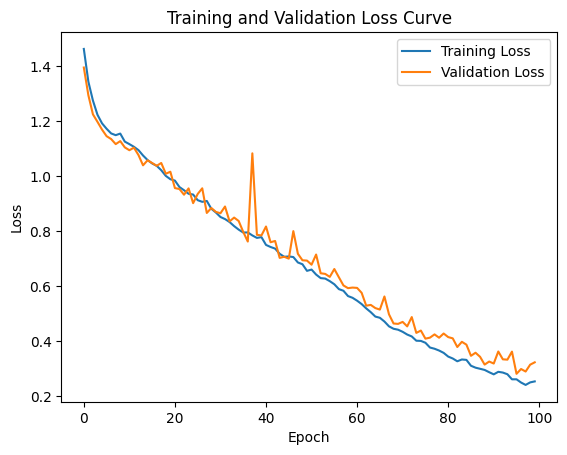

In [9]:
num_epochs = 100
# Training loop
for epoch in range(num_epochs):
    model.train()
    running_train_loss = 0.0
    for x1, x2, masks, _ in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Training"):
        x1, x2, masks = x1.to(device), x2.to(device), masks.to(device)
        
        # Zero the parameter gradients
        optimizer.zero_grad()
        
        # Forward pass
        outputs = model(x1, x2)
        
        # Calculate loss
        loss = criterion(outputs, masks)
        
        # Backward pass and optimization
        loss.backward()
        optimizer.step()
        
        # Track running training loss
        running_train_loss += loss.item()
    
    # Average train loss for the epoch
    epoch_train_loss = running_train_loss / len(train_loader)
    train_losses.append(epoch_train_loss)
    print(f"Epoch [{epoch+1}/{num_epochs}], Training Loss: {epoch_train_loss:.4f}")
    
    # Validation
    model.eval()
    running_val_loss = 0.0
    all_preds = []
    all_targets = []
    
    with torch.no_grad():
        for x1, x2, masks, _ in tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Validation"):
            x1, x2, masks = x1.to(device), x2.to(device), masks.to(device)
            
            # Forward pass
            outputs = model(x1, x2)
            loss = criterion(outputs, masks)
            running_val_loss += loss.item()
            
            # Get predicted classes and store them
            preds = torch.argmax(outputs.softmax(dim=1), dim=1)
            all_preds.append(preds)
            all_targets.append(masks)
    
    # Calculate mean validation loss
    epoch_val_loss = running_val_loss / len(val_loader)
    val_losses.append(epoch_val_loss)
    
    # Concatenate all predictions and targets for metric calculation
    all_preds = torch.cat(all_preds).cpu()
    all_targets = torch.cat(all_targets).cpu()
    metrics = calculate_multiclass_metrics(all_preds, all_targets, n_classes=3)
    val_metrics.append(metrics)
    
    print(f"Epoch [{epoch+1}/{num_epochs}], Validation Loss: {epoch_val_loss:.4f}")
    print("Validation Metrics:", metrics)

# Plotting the training and validation loss curves
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Curve')
plt.legend()
plt.show()

In [10]:
os.makedirs('/kaggle/working/trained_models', exist_ok = True)
import datetime
prefix = str(datetime.datetime.utcnow() + datetime.timedelta(hours = 5, minutes = 30)).replace(' ', '_')
torch.save(model.state_dict(),f'/kaggle/working/trained_models/{prefix}_model.pt')

In [11]:
model = Change_detection_model()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

model.load_state_dict(torch.load(f'/kaggle/working/trained_models/{prefix}_model.pt', weights_only=True))

<All keys matched successfully>

32 32


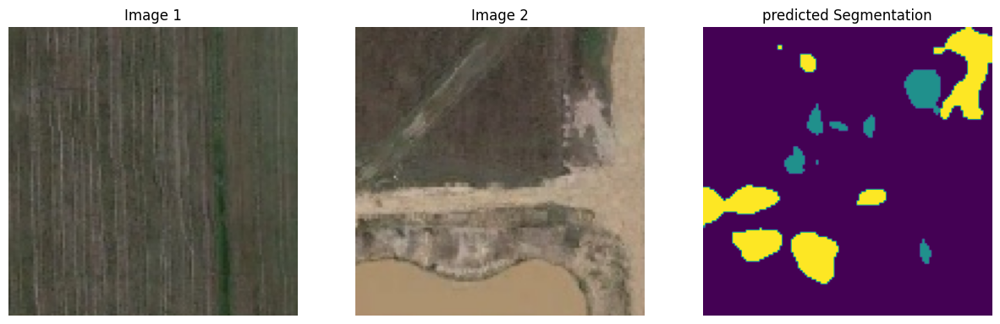

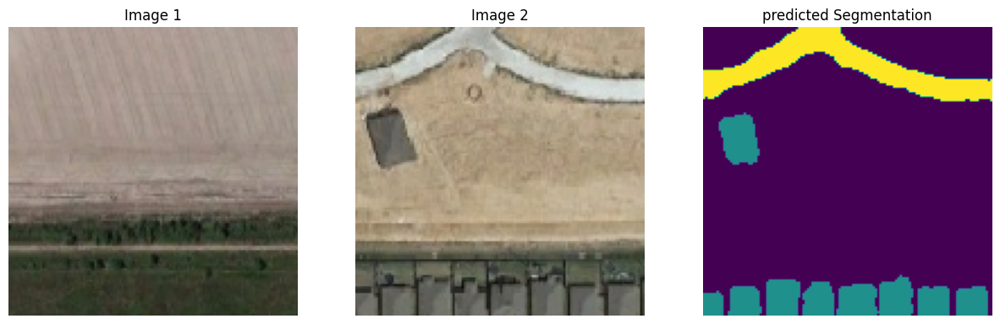

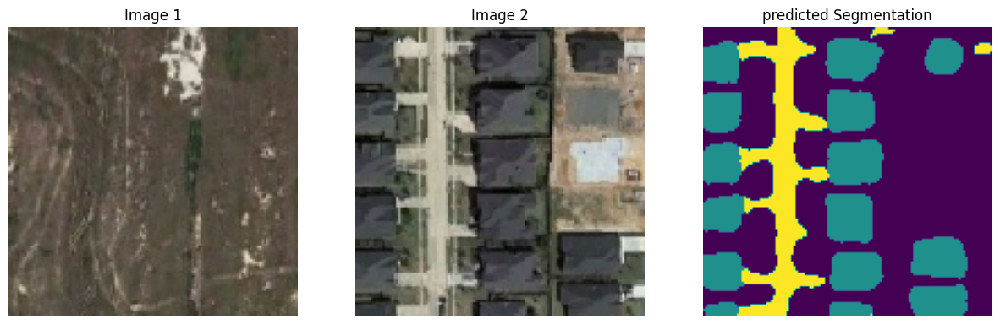

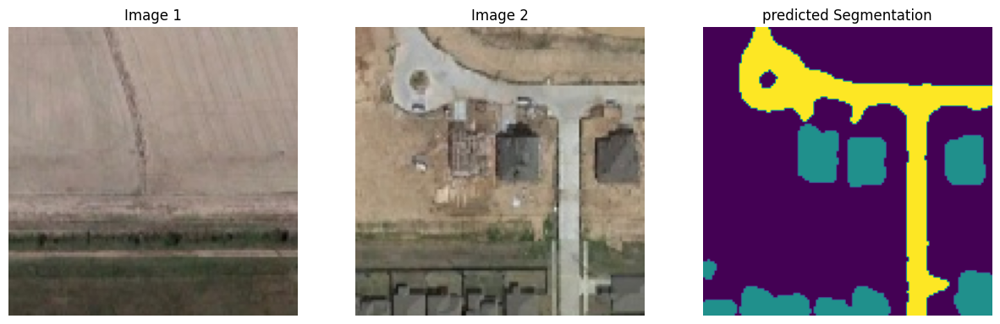

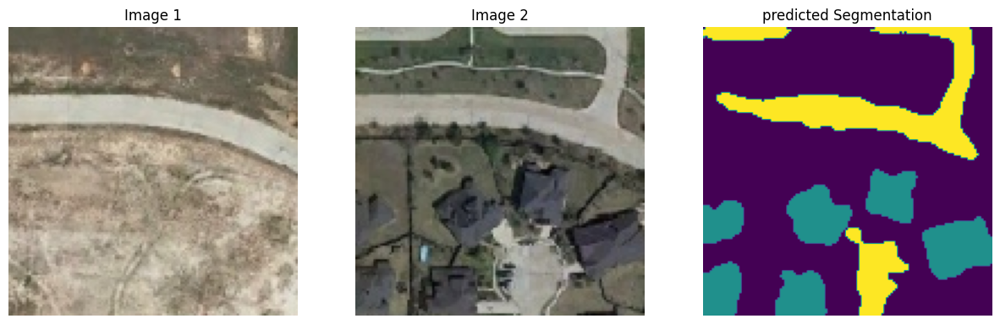

...

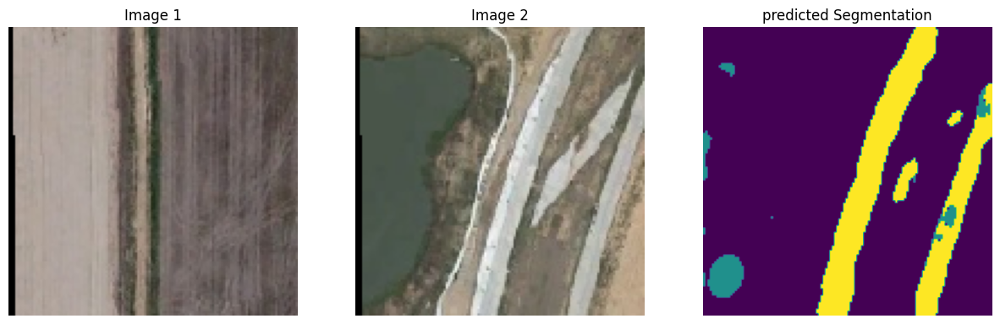

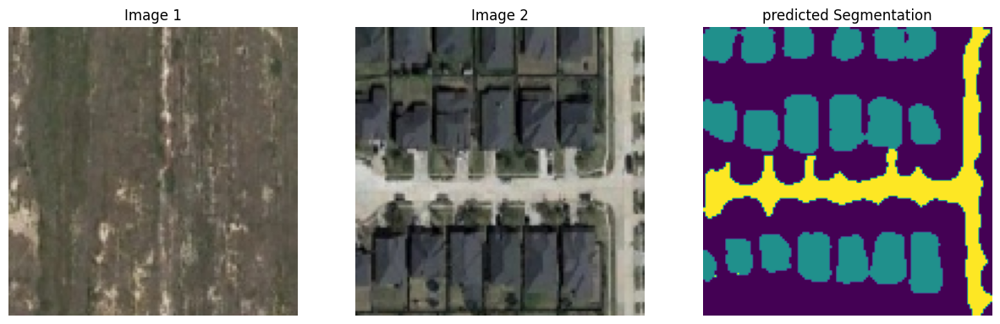

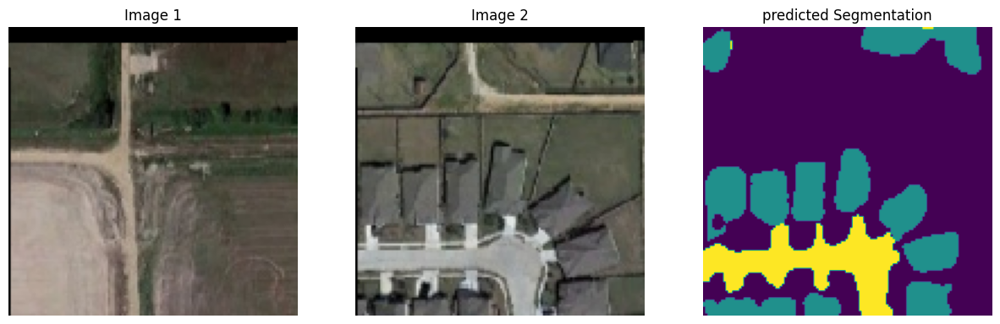

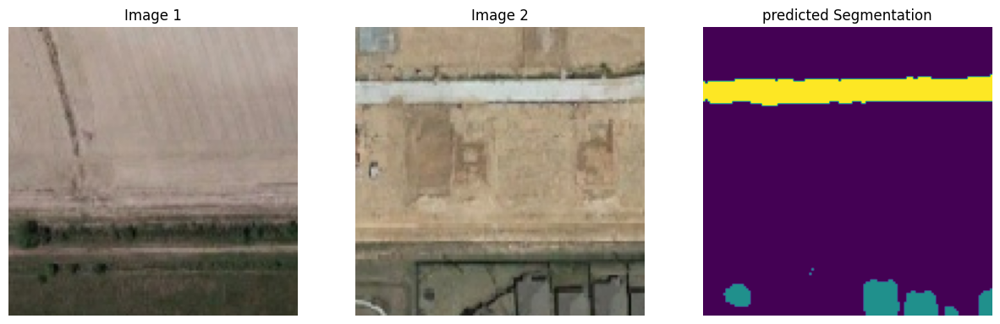

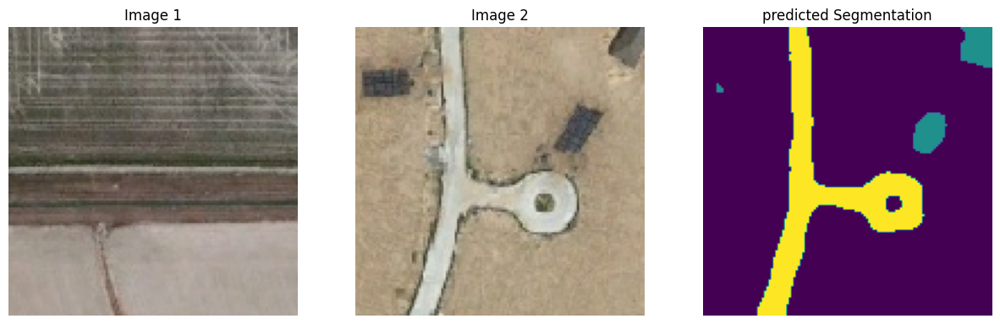

In [12]:
import glob
images_1 = glob.glob(os.path.join(BASE_DATASET_DIR,'validation/image_1/*'))
images_2 = glob.glob(os.path.join(BASE_DATASET_DIR,'validation/image_2/*'))

print(len(images_1), len(images_1))
for x_1_path, x_2_path in zip(images_1, images_2):
    
    x1 = rasterio.open(x_1_path).read()
    x2 = rasterio.open(x_2_path).read()
    
    x_1_cuda = torch.tensor(np.expand_dims(x1, 0) / 255,dtype=torch.float32, device=device)
    x_2_cuda = torch.tensor(np.expand_dims(x2, 0) / 255, dtype=torch.float32, device=device)
    pred = model(x_1_cuda, x_2_cuda).argmax(1).cpu().numpy()

    # transpose to (H, W, C) for plotting
    x1 = x1.transpose(1, 2, 0)
    x2 = x2.transpose(1, 2, 0)

    # Plotting
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(x1)
    plt.title('Image 1')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(x2)
    plt.title('Image 2')
    plt.axis('off') 

    plt.subplot(1, 3, 3)
    plt.imshow(pred[0]) 
    plt.title('predicted Segmentation')
    plt.axis('off')  # Hide axes

    plt.show()      
    